In [1]:
import sys
import copy
sys.path.insert(0, "../../")
from classes.calculators.lennardjones import LennardJones
from classes.atom_classes.atom import Atom
from classes.atom_classes.atom_collection import Atom_Collection
from classes.atom_classes.atom_collection_plotter import Animator, Atom_Collection_Plotter
from classes.optimizers.md_simulator1 import MDT_simulator
from classes.optimizers.random_struct_search import Line_searcher1
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
plt.rc('animation', html='jshtml')

In [2]:
poses = [np.array([0.0, 0.0])] + [np.array([0.0, i]) for i in [-2.6,2.5]] + [np.array([i, -1]) for i in [-2.5,2.5]] + [np.array([i, 1]) for i in [-2.5,2.5]]
frozens = np.zeros(len(poses)).astype(bool)
frozens[0] = True
atom_list = [Atom(position=pos, frozen=frozen) for pos, frozen in zip(poses, frozens)]
atom_col = Atom_Collection(atom_list)
atom_col.calculator = LennardJones()

In [3]:
optimizer = Line_searcher1(atom_col=atom_col)
optimizer.run(track=False)
opt_col = optimizer.best_atom_col
opt_col.unfreeze_atoms([0])

In [4]:
temps = np.arange(0.05, 2.35, 0.05)
logged_atom_cols = {}
for i, temp in enumerate(temps):
    md_simulator = MDT_simulator(atom_col=opt_col, temp=temp)
    md_simulator.run_MDsimulation(N_steps=1000, time_step=0.01)
    logged_atom_cols[i] = md_simulator.logged_atom_cols

In [5]:
class MD_animator(Animator):
    def __init__(self, 
                 e_line,
                 default_cols=("C0", "C1"), markersize=50, scale_with_mass=False, alpha=1) -> None:
        super().__init__(default_cols, markersize, scale_with_mass, alpha)
        self.e_line = e_line

    def animate(self, i, atom_col, position, energies):
        cm_pos = np.mean(position,axis=0)
        #print("hov")
        atom_col.set_atom_positions(position-cm_pos)
        plot_elems = self(atom_col)
        xs = np.linspace(0, i, i)
        self.e_line.set_data(xs, energies[:i])
        return plot_elems["atoms"] + [self.e_line]

[0.05 0.25 0.5  0.7  0.95 1.2 ]


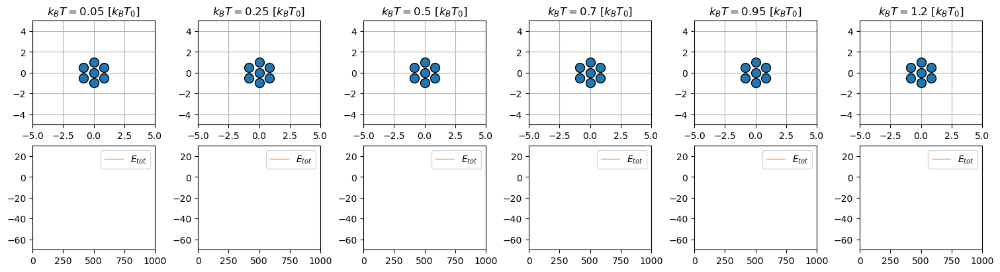

In [6]:
fig, axs = plt.subplots(2,6, figsize=(15,4), layout="constrained")

sim_nums = np.linspace(0, 23, 6).astype(int)

temp_sims = temps[sim_nums]
print(temp_sims)

plot_cols = [copy.deepcopy(logged_atom_cols[sim_num][0]) for sim_num in sim_nums]

md_animators = []
for ax in axs[1]:
    ax.set_xlim([0, 1000])
    ax.set_ylim([-70, 30])
    e_line = ax.plot([],[], "-",c="C1",label=r"$E_{tot}$", lw=1, alpha=0.8)[0]
    ax.legend()
    md_animators.append(MD_animator(e_line=e_line, markersize=10))

for ax, temp, md_animator, plot_col in zip(axs[0], temp_sims, md_animators, plot_cols):
    plot_col.reset_plot_axes()
    md_animator(atom_col=plot_col, ax=ax)
    ax.set_title(r"$k_{B}T=$"+f"{round(temp,3)}"+r" $\left[k_{B}T_0\right]$")
    ax.grid()
    ax.set_xlim([-5.0, 5.0])
    ax.set_ylim([-5.0, 5.0])


In [7]:
def update(i, md_animators, plot_cols, logged_atom_cols, sim_nums):
    tot_plot_elems = []
    for md_animator, plot_col, sim_num in zip(md_animators, plot_cols, sim_nums):
        md_atom_cols = logged_atom_cols[sim_num][:i]
        pot_es = np.array([md_atom_col.get_potential_energy() for md_atom_col in md_atom_cols])
        kin_es = np.array([md_atom_col.get_kinetic_energy() for md_atom_col in md_atom_cols])
        tot_es = pot_es + kin_es
        if i > 0:
            position = md_atom_cols[-1].positions
            tot_plot_elems+= md_animator.animate(i, plot_col, position, tot_es)
    #print("hov")
    return tot_plot_elems

In [8]:
anim = animation.FuncAnimation(fig,
                               update,
                               frames=np.arange(0, 999, 10),
                               fargs=(md_animators, plot_cols, logged_atom_cols, sim_nums),
                               interval=75,
                               blit=True)
anim

In [31]:
writer = animation.PillowWriter(fps=15,
                                 metadata=dict(artist='Me'),
                                 bitrate=1800)
anim.save("first_sims.gif", writer=writer)

[1.25 1.45 1.65 1.85 2.05 2.3 ]


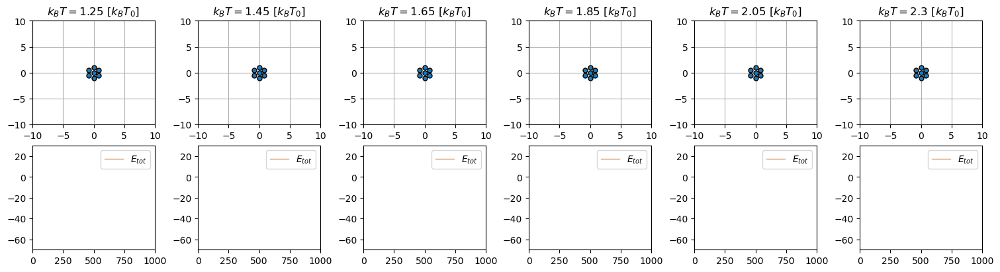

In [32]:
fig, axs = plt.subplots(2,6, figsize=(15,4), layout="constrained")

sim_nums = np.linspace(24, 45, 6).astype(int)

temp_sims = temps[sim_nums]
print(temp_sims)
plot_cols = [logged_atom_cols[sim_num][0] for sim_num in sim_nums]

md_animators = []
for ax in axs[1]:
    ax.set_xlim([0, 1000])
    ax.set_ylim([-70, 30])
    e_line = ax.plot([],[], "-",c="C1",label=r"$E_{tot}$",lw=1, alpha=0.8)[0]
    ax.legend()
    md_animators.append(MD_animator(e_line=e_line, markersize=5))

for ax, temp, md_animator, plot_col in zip(axs[0], temp_sims, md_animators, plot_cols):
    plot_col.reset_plot_axes()
    md_animator(atom_col=plot_col, ax=ax)
    ax.set_title(r"$k_{B}T=$"+f"{round(temp,3)}"+r" $\left[k_{B}T_0\right]$")
    ax.grid()
    ax.set_xlim([-10.0, 10.0])
    ax.set_ylim([-10.0, 10.0])

In [33]:
anim = animation.FuncAnimation(fig,
                               update,
                               frames=np.arange(0, 999, 10),
                               fargs=(md_animators, plot_cols, logged_atom_cols, sim_nums),
                               interval=75,
                               blit=True)
anim

In [34]:
writer = animation.PillowWriter(fps=15,
                                 metadata=dict(artist='Me'),
                                 bitrate=1800)
anim.save("last_sims.gif", writer=writer)

In [16]:
mean_Es = np.zeros(len(logged_atom_cols))
for i, sim_num in enumerate(logged_atom_cols):
    md_atom_cols = logged_atom_cols[sim_num][600:]
    energies = np.zeros(len(md_atom_cols))
    for j, md_atom_col in enumerate(md_atom_cols):
        pot_e = md_atom_col.get_potential_energy()
        kin_e = md_atom_col.get_kinetic_energy()
        energies[j] = pot_e + kin_e
    mean_Es[i] = np.mean(energies)


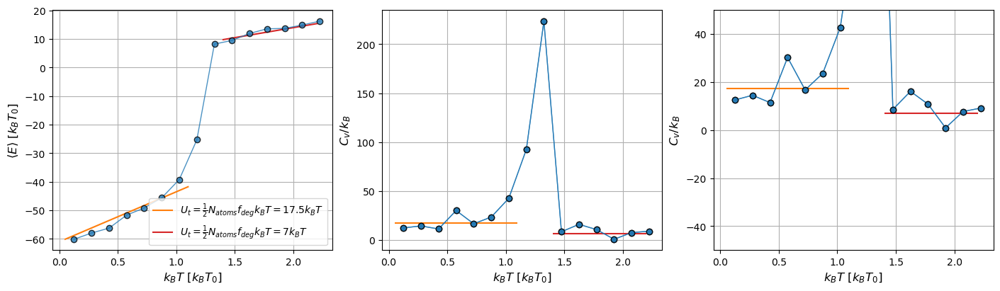

In [30]:
fig, axs = plt.subplots(1, 3, figsize=(14,4), layout="constrained")

for ax in axs:
    ax.set_xlabel(r"$k_{B}T$ $\left[k_{B}T_0\right]$", fontsize=12)
    ax.grid()


axs[0].set_ylabel(r"$\langle E \rangle$ $\left[k_{B}T_0\right]$", fontsize=12)
axs[1].set_ylabel(r"$C_v/k_{B}$", fontsize=12)
axs[2].set_ylabel(r"$C_v/k_{B}$", fontsize=12)

def lin_func(xs, a, b):
    return a*xs+b

mean_Es_eval = mean_Es[::3]
temps_eval = temps[::3]
T_plots = (temps_eval[:-1]+temps_eval[1:])*0.5

cvs = (mean_Es_eval[1:]-mean_Es_eval[:-1])/(temps_eval[1:]-temps_eval[:-1])

xs1 = np.linspace(0.05, 1.1, 100)
ys1 = lin_func(xs1, 17.5, -61)
axs[0].plot(xs1, ys1, label=r"$U_{t} = \frac{1}{2} N_{atoms}f_{deg} k_{B}T = 17.5k_{B}T$", c="C1")

xs1 = np.linspace(1.4, 2.2, 100)
ys1 = lin_func(xs1, 7, 0)
axs[0].plot(xs1, ys1, label=r"$U_{t} = \frac{1}{2} N_{atoms}f_{deg} k_{B}T = 7k_{B}T$", c="C3")
axs[0].plot(T_plots, mean_Es_eval[1:], 'o-', c="C0", lw=1, markeredgecolor="k", alpha=0.8)
axs[0].legend(loc="lower right")

axs[2].set_ylim([-50,50])
for ax in axs[1:]:
    ax.hlines(17.5, 0.05, 1.1, colors="C1")
    ax.hlines(7.0, 1.4, 2.2, colors="C3")
    ax.plot(T_plots, cvs, 'o-', c="C0", lw=1, markeredgecolor="k", alpha=0.8)
    ax.plot(T_plots, cvs, 'o-', c="C0", lw=1, markeredgecolor="k", alpha=0.8)
plt.savefig("phase_trans.svg")
